In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import datasets

In [2]:
from bs4 import BeautifulSoup
import requests

In [42]:
from sklearn.preprocessing import OneHotEncoder

In [3]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
%matplotlib inline

In [20]:
pd.set_option("display.max_columns", 200)

In [16]:
from collections import Counter

In [4]:
#create list of pages
base_url='https://sofifa.com/players?type=all&lg%5B%5D=13'
offset=60
print(base_url)
url_list = [base_url]
for i in range(10):
    
    new_link = 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset={}'.format(offset)
    url_list.append(new_link)
    print(new_link)
    offset+=60

url_list

https://sofifa.com/players?type=all&lg%5B%5D=13
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=60
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=120
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=180
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=240
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=300
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=360
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=420
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=480
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=540
https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=600


['https://sofifa.com/players?type=all&lg%5B%5D=13',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=60',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=120',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=180',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=240',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=300',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=360',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=420',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=480',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=540',
 'https://sofifa.com/players?type=all&lg%5B0%5D=13&offset=600']

In [5]:
#Create list of players
players={}
for i in url_list:
    url=i 
    response_search_page = requests.get(url)
    page_response_search_page = response_search_page.text
    soup = BeautifulSoup(page_response_search_page,'lxml')
    page_table = soup.find_all('a',class_="tooltip")
    page_table=page_table[:-4]
    page_table
    for element in page_table:
        name=element['data-tooltip']
        url='https://sofifa.com/'+element['href']+'?attr=classic'
        players[name]=[name] + [url]
        
players

{'Kevin De Bruyne': ['Kevin De Bruyne',
  'https://sofifa.com//player/192985/kevin-de-bruyne/210022/?attr=classic'],
 'Alisson Ramses Becker': ['Alisson Ramses Becker',
  'https://sofifa.com//player/212831/alisson-ramses-becker/210022/?attr=classic'],
 'Mohamed Salah': ['Mohamed Salah',
  'https://sofifa.com//player/209331/mohamed-salah/210022/?attr=classic'],
 'Sadio Mané': ['Sadio Mané',
  'https://sofifa.com//player/208722/sadio-mane/210022/?attr=classic'],
 'Virgil van Dijk': ['Virgil van Dijk',
  'https://sofifa.com//player/203376/virgil-van-dijk/210022/?attr=classic'],
 'Sergio Agüero': ['Sergio Agüero',
  'https://sofifa.com//player/153079/sergio-aguero/210022/?attr=classic'],
 'Heung Min Son': ['Heung Min Son',
  'https://sofifa.com//player/200104/heung-min-son/210022/?attr=classic'],
 'Harry Kane': ['Harry Kane',
  'https://sofifa.com//player/202126/harry-kane/210022/?attr=classic'],
 "N'Golo Kanté": ["N'Golo Kanté",
  'https://sofifa.com//player/215914/ngolo-kante/210022/?att

In [6]:
#Create data frame of players in the premier league
df_player_list = pd.DataFrame(players).T
df_player_list.columns = ['name','link']
df_player_list

,name,link
Kevin De Bruyne,Kevin De Bruyne,https://sofifa.com//player/192985/kevin-de-bru...
Alisson Ramses Becker,Alisson Ramses Becker,https://sofifa.com//player/212831/alisson-rams...
Mohamed Salah,Mohamed Salah,https://sofifa.com//player/209331/mohamed-sala...
Sadio Mané,Sadio Mané,https://sofifa.com//player/208722/sadio-mane/2...
Virgil van Dijk,Virgil van Dijk,https://sofifa.com//player/203376/virgil-van-d...
...,...,...
Lewis Brunt,Lewis Brunt,https://sofifa.com//player/246392/lewis-brunt/...
Callum Rowe,Callum Rowe,https://sofifa.com//player/243890/callum-rowe/...
Kyron Gordon,Kyron Gordon,https://sofifa.com//player/251546/kyron-gordon...
Jean Belehouan,Jean Belehouan,https://sofifa.com//player/251674/jean-belehou...


In [7]:
df_player_list.shape

(649, 2)

In [10]:
#Create dictionary of just skills
def create_skill_card_dict(l1):
    l2=l1[::2]
    #print(l2)
    #Creating list containing values alone by slicing
    l3=l1[1::2]
    #merging two lists uisng zip()
    z=zip(l2,l3)
    #print(z)
    #Converting zip object to dict using dict() constructor.
    return dict(z)

In [13]:
#Duplicate of line above - REMOVE
def create_dict(l1):
    l2=l1[::2]
    print(l2)
    #Creating list containing values alone by slicing
    l3=l1[1::2]
    #merging two lists uisng zip()
    z=zip(l2,l3)
    #print(z)
    #title
    #Converting zip object to dict using dict() constructor.
    return dict(z)

In [17]:
#Create full/combined dictionary of player's info and skills
def get_player_dict_combo(link):
    """
    From soFIFA player link, request player html, parse with B-Soup, and collect:
     - Name, Nationality
     - Age, Height, Weight
     - Overall Score, Potential Score
     - Value, Wage
     - Player Skills
    Return info as a dictionary
    """
    #Create full url to scrape
    url=link
    
    #Request HTML and parse
    response = requests.get(url)
    page = response.text
    soup = BeautifulSoup(page,"lxml")
    
    headers = ['name','nationality','position','age','height','weight','club','overall_rating','value','wage']
    
    #Name
    player_name = soup.find('div',class_='info').text.split('\n')[0]
    #player_name
    
    #Nationality
    player_name_national = soup.find('div',class_='info').find('a').get('title')
    #player_name_national
    
    #Primary Position
    player_position = soup.find('div',class_='info').find('span').text
    
    #age
    player_age = soup.find('div',class_='info').text.split(' ')[-6]
    #player_name_age
    
    #height and weight
    player_height = soup.find('div',class_='info').text.split(' ')[-2]
    #print(player_name_height)

    player_weight = soup.find('div',class_='info').text.split(' ')[-1]
    #print(player_name_weight)
    
    #Current Club
    soup_player_card_club = soup.find_all('div',class_="column col-3")[6]
    player_club = soup_player_card_club.text.split('\n')[2]
    
    #Overall rating
    player_name_overall_rating = soup.find_all('div',class_="column col-3")
    player_values=[]
    for i in player_name_overall_rating[:4]:
        player_values.append(i.text)
    
    player_name_overall_rating_value = player_values[0][0:2]
    #player_name_overall_rating_value
    
    #value 
    player_name_transfer_value = player_values[2][:-5]
    #player_name_transfer_value
    
    #wage
    player_name_week_wage = player_values[3][:-5]
    #player_name_annual_wage = 52*player_name_week_wage
    #player_name_transfer_value
    
    #Create player dictionary and return
    player_dict = dict(zip(headers, [player_name,
                                player_name_national,player_position,player_age,player_height,player_weight,player_club,
                                player_name_overall_rating_value,
                                player_name_transfer_value, 
                                player_name_week_wage]))
    
    ######################################################################################
    
    soup_player_card_info = soup.find_all('div',class_="column col-3")[7]

    #soup_player_card_info.text.split('\n')[2]
    if soup_player_card_info.text.split('\n')[2] == 'Attacking':
        #Create player skill cards for NON-NATIONAL TEAM MEMBERS
        soup_player_cards = soup.find_all('div',class_="column col-3")
        #print(soup_player_cards)

        player_skill_cards=[]

        for i in soup_player_cards[7:11]:
            player_skill_cards+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        #player_skill_cards

        player_skills = create_skill_card_dict(player_skill_cards)
        #print(player_skills)

        #Mentality
        #mentality=['Composure']

        #mentality+=(ratings.get_text() for ratings in soup_player_cards[11].find_all('span')[::-1])

        #mentality = dict(mentality)

        #Defending
        player_skill_cards_defending=[]

        for i in soup_player_cards[12:13]:
            player_skill_cards_defending+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        #print(player_skill_cards_defending)
        player_skill_cards_defending=create_dict(player_skill_cards_defending)
        #player_skill_cards_defending

        #Create player skill card trait dictionary
        player_skill_cards_traits=[]

        for i in soup_player_cards[14:15]:
            player_skill_cards_traits+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        player_skill_cards_traits=Counter(player_skill_cards_traits)
        #print(player_skill_cards_traits)
        #player_skill_cards_traits

        full_player_dict = {**player_dict, **player_skills, **player_skill_cards_defending,**player_skill_cards_traits}        
    
    
    else:
        
        #Create player skill cards for NATIONAL TEAM MEMBERS
        soup_player_cards = soup.find_all('div',class_="column col-3")
        #print(soup_player_cards)

        player_skill_cards=[]

        for i in soup_player_cards[8:12]:
            player_skill_cards+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        #player_skill_cards

        player_skills = create_skill_card_dict(player_skill_cards)
        #print(player_skills)

        #Mentality
        #mentality=['Composure']
        #mentality+=(ratings.get_text() for ratings in soup_player_cards[11].find_all('span')[::-1])
        #mentality = dict(mentality)

        #Defending
        player_skill_cards_defending=[]

        for i in soup_player_cards[13:14]:
            player_skill_cards_defending+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        #print(player_skill_cards_defending)
        player_skill_cards_defending=create_dict(player_skill_cards_defending)
        #player_skill_cards_defending

        #Create player skill card trait dictionary
        player_skill_cards_traits=[]

        for i in soup_player_cards[15:16]:
            player_skill_cards_traits+=(ratings.get_text() for ratings in i.find_all('span')[::-1])

        player_skill_cards_traits=Counter(player_skill_cards_traits)
        #print(player_skill_cards_traits)
        #player_skill_cards_traits

        full_player_dict = {**player_dict, **player_skills, **player_skill_cards_defending,**player_skill_cards_traits}
    
    
    
    
    
    return full_player_dict

In [18]:
#Collect data from all players' pages
full_player_list=[]
for i in df_player_list.link:
    full_player_list.append(get_player_dict_combo(i))

[<div class="column col-3"><div><span class="bp3-tag p p-91">91</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-91">91</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€127.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€370K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Hig

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-90">90</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-90">90</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€120.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€250K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-90">90</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-91">91</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€113M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€210K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-89">89</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-89">89</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€83.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€300K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medi

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-89">89</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-90">90</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€123M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€230K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€78M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€190K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-89">89</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€109M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€270K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-91">91</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€121M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€240K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-92">92</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€114M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€110K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-89">89</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€90.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€155K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€26M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€125K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€57M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€140K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€81M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€195K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

[<div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€46.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€150K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Me

[<div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€77.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€190K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medi

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€74.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€135K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€52.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€150K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€46.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€170K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€66.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€145K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Hi

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-91">91</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€86.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€150K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <l

[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€37M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€130K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Medi

[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€17.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€100K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Me

[<div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€58M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€120K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</

[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€33.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Med

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-92">92</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€94.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-

[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€45.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€110K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Mediu

[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€51M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€155K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€21M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ell

[<div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€42M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€140K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€36.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€125K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€49.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€52.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€140K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow

[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€52M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€125K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€35M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€185K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€39.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€89K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€41.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€75K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€30.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€115K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Med

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€41.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€110K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Hi

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€33M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€82K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</s

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€40M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€85K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€47M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium<

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€46M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</sp

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€41.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€89K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€46M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€89K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Low/ High</sp

[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€18.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€100K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€24M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€59K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€41.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€83K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-

[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€27.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Hig

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€41M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€40.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€25M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€28M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€26K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <lab

[<div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€34.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€46K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€28M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€84K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <la

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€43M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€70K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <labe

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€23M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€65K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Mediu

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€21M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€65K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Medium

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€21M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€81K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High<

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€21M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€105K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Mediu

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-88">88</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€46.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€100K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-tex

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-87">87</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€36M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€70K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€19M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€90K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€22M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€86K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High</

[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€25.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€74K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Hig

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€13.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€81K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€29M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€69K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€33.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€65K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflo

[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€76K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Low/ Medium<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€11M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-ov

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€24M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€70K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€12.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€76K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€19.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€73K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Med

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€22M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€100K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€24.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€86K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€22M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€95K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-86">86</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€33.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€31K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overfl

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€18.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€76K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <la

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€27.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€80K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€26M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€34K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€15M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€50K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€13.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€76K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overfl

[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€9.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€38K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Medi

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€19.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€73K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€43K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</

[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€13.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€41K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Mediu

[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€43K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Mediu

[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€14M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€51K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Mediu

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€13.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€39K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <la

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€20.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€72K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€14.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€63K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <la

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€11M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€65K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€14M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€52K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-ov

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€22M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€68K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€12.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€69K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€10.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€54K<div class="sub">Wage</div></div>
</di

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€62K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-

[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€14.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€62K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€15M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€76K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€11M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€33K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€9.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€35K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Mediu

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€12.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€82K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> 

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€12.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€57K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <la

[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€10.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€52K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Med

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€52K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <labe

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div

[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€6.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€51K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High

[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€51K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€78K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</sp

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€37K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-ov

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€34K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflo

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.8M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€26K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€34K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <labe

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€48K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.8M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€34K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</sp

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€4.2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€66K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile<

[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€4M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€69K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ Medium<

[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.7M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€69K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-84">84</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€26K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <lab

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€29K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-ov

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€43K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflo

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€7M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€36K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-over

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.3M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€28K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€4.4M<div class="sub">Value</div></div></div>, <div class="c

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="su

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.3M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€61K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.7M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€25K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <lab

[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.1M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€26K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.6M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€33K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <lab

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.3M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€42K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.4M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€14K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€16K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <lab

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-85">85</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€13K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

In [21]:
#Create data frame for all players' info
all_players = pd.DataFrame(full_player_list)  #convert list of dict to df
all_players.set_index('name', inplace=True)

all_players

,nationality,position,age,height,weight,club,overall_rating,value,wage,Volleys,Short Passing,Heading Accuracy,Finishing,Crossing,Ball Control,Long Passing,FK Accuracy,Curve,Dribbling,Balance,Reactions,Agility,Sprint Speed,Acceleration,Long Shots,Strength,Stamina,Jumping,Shot Power,Sliding Tackle,Standing Tackle,Defensive Awareness,Outside Foot Shot,Playmaker (AI),Long Shot Taker (AI),Long Passer (AI),Early Crosser,Leadership,Injury Prone,Rushes Out Of Goal,GK Long Throw,Chip Shot (AI),Speed Dribbler (AI),Finesse Shot,Flair,Power Header,Solid Player,Team Player,Comes For Crosses,Dives Into Tackles (AI),Technical Dribbler (AI),Saves with Feet,Cautious With Crosses,Long Throw-in,Power Free-Kick,Giant Throw-in
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Kevin De Bruyne,Belgium,CM,29y.o.,"5'11""",154lbs\n,Manchester City,91,€127.5M,€370K,82,94,55,82,94,92,93,83,85,88,76,91,78,76,77,91,74,89,63,91,53,65,68,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alisson Ramsés Becker,Brazil,GK,27y.o.,"6'3""",201lbs\n,Liverpool,90,€102M,€160K,20,45,19,13,17,30,44,18,19,27,37,88,40,47,56,14,78,32,52,64,16,19,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mohamed Salah Ghaly,Egypt,RW,28y.o.,"5'9""",157lbs\n,Liverpool,90,€120.5M,€250K,79,84,59,91,79,89,75,69,83,90,91,92,91,92,94,84,75,85,69,80,41,43,38,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sadio Mané,Senegal,LW,28y.o.,"5'9""",152lbs\n,Liverpool,90,€120.5M,€250K,75,85,84,90,76,89,71,64,77,91,88,93,93,93,95,79,71,88,86,84,38,42,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Virgil van Dijk,Netherlands,CB,28y.o.,"6'4""",203lbs\n,Liverpool,90,€113M,€210K,45,79,87,52,53,77,86,70,60,70,53,89,61,79,72,64,92,75,90,81,86,93,93,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lewis Brunt,England,CM,19y.o.,"5'10""",150lbs\n,Aston Villa,52,€210K,€4K,38,61,46,30,43,46,60,42,38,47,69,49,53,69,60,41,48,63,55,57,46,45,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Callum Miles Rowe,England,LB,20y.o.,"5'11""",154lbs\n,Aston Villa,52,€180K,€5K,40,63,51,28,43,53,59,37,35,53,68,54,56,60,64,33,48,53,60,57,52,41,44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Kyron Gordon,England,CB,18y.o.,"6'1""",154lbs\n,Sheffield United,52,€190K,€1K,31,35,52,25,32,40,32,31,33,28,52,44,46,62,63,24,57,51,64,47,54,53,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
#Ensure fields are numeric for analysis. Note that columns "Outside Foot Shot" to "Giant Throw In" were scraped as binary encoded variables. 
all_players[['overall_rating']] = all_players[['overall_rating']].apply(pd.to_numeric)

all_players[['Volleys','Short Passing','Heading Accuracy','Finishing','Crossing','Ball Control',
    'Long Passing','FK Accuracy','Curve','Dribbling','Balance','Reactions','Agility',
    'Sprint Speed','Acceleration','Long Shots','Strength','Stamina','Jumping','Shot Power',
    'Sliding Tackle','Standing Tackle','Defensive Awareness']] = all_players[['Volleys','Short Passing','Heading Accuracy','Finishing','Crossing','Ball Control',
    'Long Passing','FK Accuracy','Curve','Dribbling','Balance','Reactions','Agility',
    'Sprint Speed','Acceleration','Long Shots','Strength','Stamina','Jumping','Shot Power',
    'Sliding Tackle','Standing Tackle','Defensive Awareness']].apply(pd.to_numeric)


In [ ]:
#Clean other numeric fields currently stored as strings
all_players['wage'] = all_players['wage'].map(lambda x: x.lstrip('€'))
all_players['value'] = all_players['value'].map(lambda x: x.lstrip('€'))

In [65]:
#Adjust monetary values
all_players['wage']=all_players['wage'].replace({'K': '*1e3', 'M': '*1e6'}, regex=True).map(pd.eval).astype(int)
all_players['value']=all_players['value'].replace({'K': '*1e3', 'M': '*1e6'}, regex=True).map(pd.eval).astype(int)

In [68]:
#Convert wage to annual salary
all_players['wage'] = all_players['wage']*52

In [72]:
#Convert age to int
all_players['age'] = all_players['age'].map(lambda x: x.rstrip('y.o.'))
all_players[['age']] = all_players[['age']].apply(pd.to_numeric)

In [79]:
#Convert weight to numeric
#Convert age to int
all_players['weight'] = all_players['weight'].map(lambda x: x.rstrip('lbs\n'))
all_players[['weight']] = all_players[['weight']].apply(pd.to_numeric)

<ipython-input-79-91befd5a1c4d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_players['weight'] = all_players['weight'].map(lambda x: x.rstrip('lbs\n'))
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [74]:
#Add league title
all_players['league']='EPL'

In [77]:
cols = list(all_players.columns.values) 
cols.pop(cols.index('value')) 
cols.pop(cols.index('wage')) 
all_players = all_players[cols+['wage']]

In [105]:
#Convert height to inches
def height_convert(val):
    r"""convert from 6' 2" to metric"""
    new_val = val.split("'")
    a = int(new_val[0]) * 12
    b = int(new_val[1])
    return (a + b)

In [106]:
all_players['height'] = all_players['height'].map(lambda x: x.rstrip('"'))

<ipython-input-106-013079ab2b35>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_players['height'] = all_players['height'].map(lambda x: x.rstrip('"'))


In [109]:
all_players['height'] = all_players['height'].apply(height_convert)

In [116]:
del all_players['height_new']

In [117]:
all_players.head()

,nationality,position,age,height,weight,club,overall_rating,Volleys,Short Passing,Heading Accuracy,Finishing,Crossing,Ball Control,Long Passing,FK Accuracy,Curve,Dribbling,Balance,Reactions,Agility,Sprint Speed,Acceleration,Long Shots,Strength,Stamina,Jumping,Shot Power,Sliding Tackle,Standing Tackle,Defensive Awareness,Outside Foot Shot,Playmaker (AI),Long Shot Taker (AI),Long Passer (AI),Early Crosser,Leadership,Injury Prone,Rushes Out Of Goal,GK Long Throw,Chip Shot (AI),Speed Dribbler (AI),Finesse Shot,Flair,Power Header,Solid Player,Team Player,Comes For Crosses,Dives Into Tackles (AI),Technical Dribbler (AI),Saves with Feet,Cautious With Crosses,Long Throw-in,Power Free-Kick,Giant Throw-in,league,wage
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Kevin De Bruyne,Belgium,CM,29,71,154,Manchester City,91,82,94,55,82,94,92,93,83,85,88,76,91,78,76,77,91,74,89,63,91,53,65,68,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPL,19240000
Alisson Ramsés Becker,Brazil,GK,27,75,201,Liverpool,90,20,45,19,13,17,30,44,18,19,27,37,88,40,47,56,14,78,32,52,64,16,19,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPL,8320000
Mohamed Salah Ghaly,Egypt,RW,28,69,157,Liverpool,90,79,84,59,91,79,89,75,69,83,90,91,92,91,92,94,84,75,85,69,80,41,43,38,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPL,13000000
Sadio Mané,Senegal,LW,28,69,152,Liverpool,90,75,85,84,90,76,89,71,64,77,91,88,93,93,93,95,79,71,88,86,84,38,42,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPL,13000000
Virgil van Dijk,Netherlands,CB,28,76,203,Liverpool,90,45,79,87,52,53,77,86,70,60,70,53,89,61,79,72,64,92,75,90,81,86,93,93,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,EPL,10920000


In [86]:
all_players.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 56 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   nationality              649 non-null    object 
 1   position                 649 non-null    object 
 2   age                      649 non-null    int64  
 3   height                   649 non-null    object 
 4   weight                   649 non-null    int64  
 5   club                     649 non-null    object 
 6   overall_rating           649 non-null    int64  
 7   Volleys                  649 non-null    int64  
 8   Short Passing            649 non-null    int64  
 9   Heading Accuracy         649 non-null    int64  
 10  Finishing                649 non-null    int64  
 11  Crossing                 649 non-null    int64  
 12  Ball Control             649 non-null    int64  
 13  Long Passing             649 non-null    int64  
 14  FK Accura

In [115]:
all_players.describe()

,age,height,weight,overall_rating,Volleys,Short Passing,Heading Accuracy,Finishing,Crossing,Ball Control,Long Passing,FK Accuracy,Curve,Dribbling,Balance,Reactions,Agility,Sprint Speed,Acceleration,Long Shots,Strength,Stamina,Jumping,Shot Power,Sliding Tackle,Standing Tackle,Defensive Awareness,Outside Foot Shot,Playmaker (AI),Long Shot Taker (AI),Long Passer (AI),Early Crosser,Leadership,Injury Prone,Rushes Out Of Goal,GK Long Throw,Chip Shot (AI),Speed Dribbler (AI),Finesse Shot,Flair,Power Header,Solid Player,Team Player,Comes For Crosses,Dives Into Tackles (AI),Technical Dribbler (AI),Saves with Feet,Cautious With Crosses,Long Throw-in,Power Free-Kick,Giant Throw-in,wage,height_new
count,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,51.0,45.0,89.0,74.0,32.0,32.0,66.0,15.0,16.0,9.0,75.0,31.0,102.0,39.0,59.0,38.0,24.0,48.0,96.0,8.0,5.0,29.0,10.0,3.0,6.490000e+02,649.000000
mean,24.879815,71.816641,167.382126,72.924499,48.300462,66.671803,56.949153,50.969183,57.177196,66.543914,60.870570,48.126348,55.095532,63.317411,66.151002,70.211094,66.607088,67.334361,67.255778,53.283513,66.836672,65.767334,66.858243,65.018490,51.357473,54.517720,53.510015,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.666046e+06,71.816641
std,4.644562,2.777550,17.358832,8.279017,19.442476,14.544901,18.908785,20.821529,19.700012,16.611065,14.984927,19.356374,20.114030,19.646200,13.947277,10.063846,13.699419,13.497282,13.643473,20.616196,12.427362,15.547710,11.504089,13.923168,23.246102,23.165602,21.743815,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.450181e+06,2.777550
min,16.000000,64.000000,123.000000,50.000000,5.000000,18.000000,10.000000,5.000000,9.000000,11.000000,11.000000,8.000000,9.000000,8.000000,21.000000,41.000000,23.000000,16.000000,17.000000,6.000000,30.000000,16.000000,31.000000,24.000000,8.000000,10.000000,7.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.600000e+04,64.000000
25%,21.000000,70.000000,154.000000,68.000000,34.000000,61.000000,48.000000,35.000000,47.000000,61.000000,52.000000,34.000000,42.000000,58.000000,57.000000,64.000000,58.000000,60.000000,59.000000,39.000000,59.000000,58.000000,60.000000,54.000000,29.000000,34.000000,36.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,7.800000e+05,70.000000
50%,25.000000,72.000000,165.000000,75.000000,50.000000,70.000000,60.000000,54.000000,63.000000,71.000000,63.000000,49.000000,60.000000,68.000000,68.000000,72.000000,68.000000,68.000000,68.000000,58.000000,68.000000,68.000000,68.000000,67.000000,57.000000,61.000000,58.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.184000e+06,72.000000
75%,28.000000,74.000000,179.000000,78.000000,64.000000,77.000000,71.000000,68.000000,72.000000,77.000000,72.000000,64.000000,70.000000,76.000000,76.000000,77.000000,76.000000,77.000000,77.000000,70.000000,76.000000,76.000000,75.000000,76.000000,72.000000,75.000000,73.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.744000e+06,74.000000
max,38.000000,79.000000,223.000000,91.000000,90.000000,94.000000,90.000000,94.000000,94.000000,92.000000,93.000000,91.000000,92.000000,92.000000,96.000000,93.000000,95.000000,96.000000,97.000000,92.000000,93.000000,96.000000,93.000000,92.000000,90.000000,93.000000,93.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.924000e+07,79.000000


In [122]:
all_players.drop(all_players.columns[30:55], axis=1)

,nationality,position,age,height,weight,club,overall_rating,Volleys,Short Passing,Heading Accuracy,Finishing,Crossing,Ball Control,Long Passing,FK Accuracy,Curve,Dribbling,Balance,Reactions,Agility,Sprint Speed,Acceleration,Long Shots,Strength,Stamina,Jumping,Shot Power,Sliding Tackle,Standing Tackle,Defensive Awareness,wage
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Kevin De Bruyne,Belgium,CM,29,71,154,Manchester City,91,82,94,55,82,94,92,93,83,85,88,76,91,78,76,77,91,74,89,63,91,53,65,68,19240000
Alisson Ramsés Becker,Brazil,GK,27,75,201,Liverpool,90,20,45,19,13,17,30,44,18,19,27,37,88,40,47,56,14,78,32,52,64,16,19,15,8320000
Mohamed Salah Ghaly,Egypt,RW,28,69,157,Liverpool,90,79,84,59,91,79,89,75,69,83,90,91,92,91,92,94,84,75,85,69,80,41,43,38,13000000
Sadio Mané,Senegal,LW,28,69,152,Liverpool,90,75,85,84,90,76,89,71,64,77,91,88,93,93,93,95,79,71,88,86,84,38,42,42,13000000
Virgil van Dijk,Netherlands,CB,28,76,203,Liverpool,90,45,79,87,52,53,77,86,70,60,70,53,89,61,79,72,64,92,75,90,81,86,93,93,10920000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lewis Brunt,England,CM,19,70,150,Aston Villa,52,38,61,46,30,43,46,60,42,38,47,69,49,53,69,60,41,48,63,55,57,46,45,41,208000
Callum Miles Rowe,England,LB,20,71,154,Aston Villa,52,40,63,51,28,43,53,59,37,35,53,68,54,56,60,64,33,48,53,60,57,52,41,44,260000
Kyron Gordon,England,CB,18,73,154,Sheffield United,52,31,35,52,25,32,40,32,31,33,28,52,44,46,62,63,24,57,51,64,47,54,53,49,52000


In [123]:
#Check primary numerical columns. Set aside binary values. 
#Those represent specific traits assigned to the player from the data source
all_players.drop(all_players.columns[30:55], axis=1).corr()


,age,height,weight,overall_rating,Volleys,Short Passing,Heading Accuracy,Finishing,Crossing,Ball Control,Long Passing,FK Accuracy,Curve,Dribbling,Balance,Reactions,Agility,Sprint Speed,Acceleration,Long Shots,Strength,Stamina,Jumping,Shot Power,Sliding Tackle,Standing Tackle,Defensive Awareness,wage
age,1.000000,0.195549,0.381817,0.561545,0.074176,0.107627,0.087526,0.009712,0.056026,0.027532,0.199356,0.077483,0.074755,-0.085157,-0.167217,0.540411,-0.120460,-0.293161,-0.306193,0.071962,0.371802,-0.008402,0.317643,0.292320,0.062774,0.075004,0.107038,0.402705
height,0.195549,1.000000,0.745838,0.054762,-0.443974,-0.370151,-0.018013,-0.483638,-0.547363,-0.481053,-0.284361,-0.475764,-0.530233,-0.553537,-0.831653,0.009613,-0.718003,-0.470718,-0.651996,-0.471331,0.552928,-0.351302,0.140789,-0.220306,-0.061819,-0.077046,-0.067721,-0.036792
weight,0.381817,0.745838,1.000000,0.205373,-0.279491,-0.200170,0.068598,-0.319230,-0.374862,-0.307385,-0.119021,-0.298476,-0.341187,-0.389241,-0.669348,0.164939,-0.573242,-0.381717,-0.539441,-0.270198,0.625702,-0.243419,0.206695,-0.003707,-0.007754,-0.004691,0.008956,0.087860
overall_rating,0.561545,0.054762,0.205373,1.000000,0.322935,0.531483,0.281230,0.304364,0.361253,0.442042,0.528735,0.314717,0.366856,0.323693,0.123775,0.937596,0.271812,0.197533,0.153967,0.357968,0.445775,0.453440,0.364956,0.578752,0.209152,0.251767,0.294493,0.804498
Volleys,0.074176,-0.443974,-0.279491,0.322935,1.000000,0.687705,0.479245,0.921270,0.730278,0.800580,0.563143,0.786558,0.835490,0.805484,0.603749,0.387138,0.662293,0.518286,0.543341,0.898929,0.052232,0.586653,0.071898,0.758282,0.042832,0.119476,0.141940,0.408368
Short Passing,0.107627,-0.370151,-0.200170,0.531483,0.687705,1.000000,0.663837,0.672927,0.805020,0.930621,0.914787,0.725302,0.787462,0.851142,0.549576,0.556779,0.578108,0.491712,0.469780,0.756393,0.246456,0.803934,0.221806,0.610010,0.551880,0.617512,0.638646,0.511179
Heading Accuracy,0.087526,-0.018013,0.068598,0.281230,0.479245,0.663837,1.000000,0.450193,0.523443,0.669020,0.547908,0.375788,0.465656,0.597228,0.139677,0.354209,0.177883,0.339580,0.199809,0.476340,0.532666,0.613048,0.505322,0.335240,0.594511,0.631953,0.657514,0.266291
Finishing,0.009712,-0.483638,-0.319230,0.304364,0.921270,0.672927,0.450193,1.000000,0.735252,0.809736,0.526389,0.767963,0.826186,0.832774,0.634797,0.365167,0.710799,0.592492,0.614671,0.914261,0.020109,0.619155,0.022756,0.743757,-0.015319,0.063996,0.084217,0.383756
Crossing,0.056026,-0.547363,-0.374862,0.361253,0.730278,0.805020,0.523443,0.735252,1.000000,0.871715,0.716272,0.780055,0.896549,0.891588,0.675932,0.385501,0.711186,0.621445,0.642042,0.799175,0.017718,0.753067,0.108863,0.569957,0.422304,0.473188,0.484609,0.381762
Ball Control,0.027532,-0.481053,-0.307385,0.442042,0.800580,0.930621,0.669020,0.809736,0.871715,1.000000,0.800346,0.771612,0.863743,0.953619,0.660521,0.483181,0.708895,0.629476,0.621749,0.844262,0.153599,0.814174,0.179037,0.637982,0.425928,0.493095,0.516275,0.453187


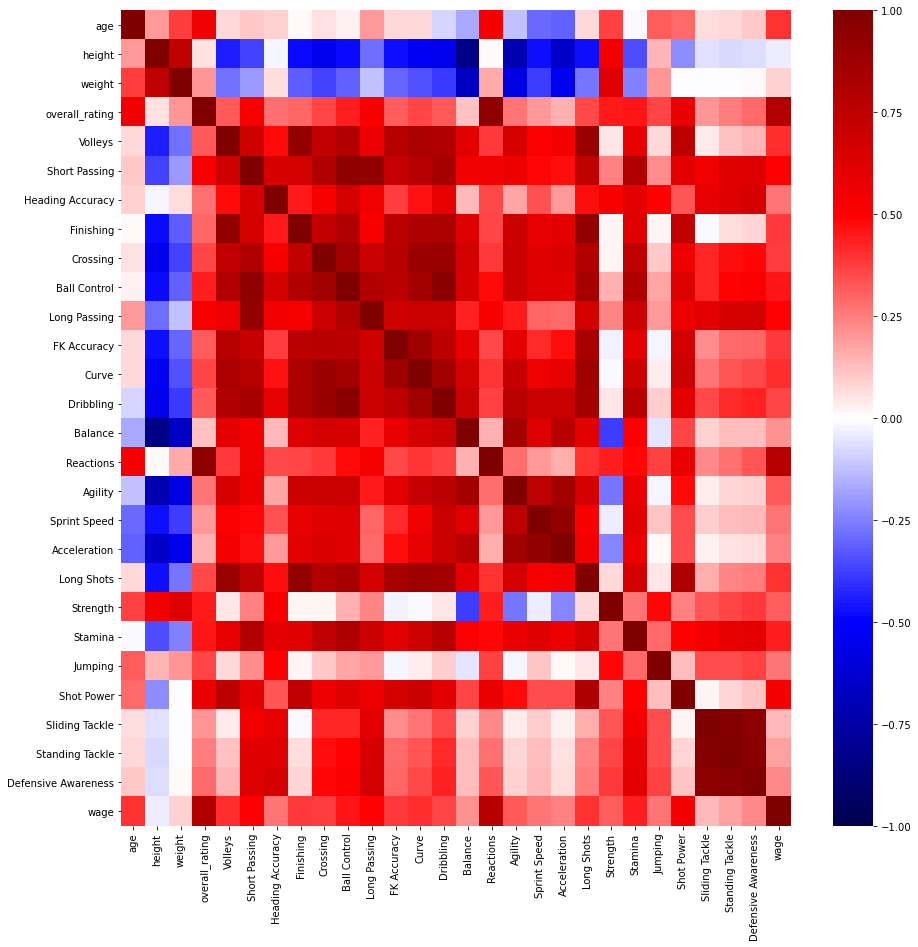

In [124]:
#Correlation plot can be reduced to remove the binary classifiers for specific player attributes
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(all_players.drop(all_players.columns[30:55], axis=1).corr(), cmap="seismic", vmin=-1, vmax=1, ax=ax);

In [128]:
temp_all_players = all_players.drop(all_players.columns[30:55], axis=1)

<ipython-input-129-73e34edf91ae>:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  pd.plotting.scatter_matrix(temp_all_players[temp_all_players.columns], ax=ax);


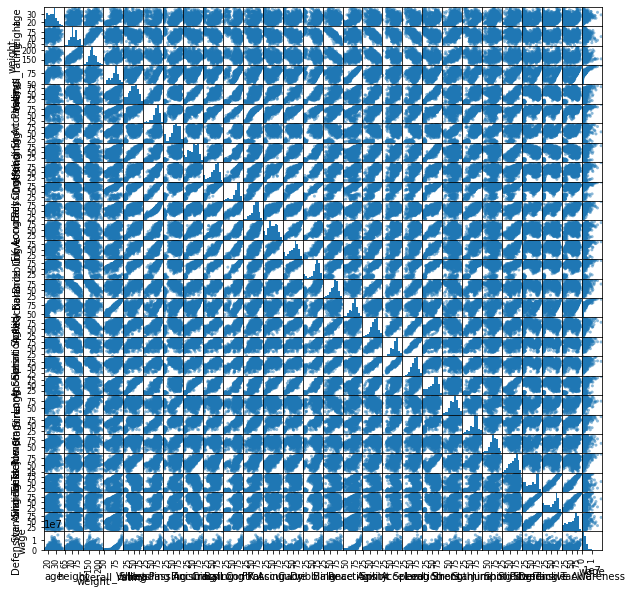

In [129]:
fig, ax = plt.subplots(figsize=(10, 10))
pd.plotting.scatter_matrix(temp_all_players[temp_all_players.columns], ax=ax);

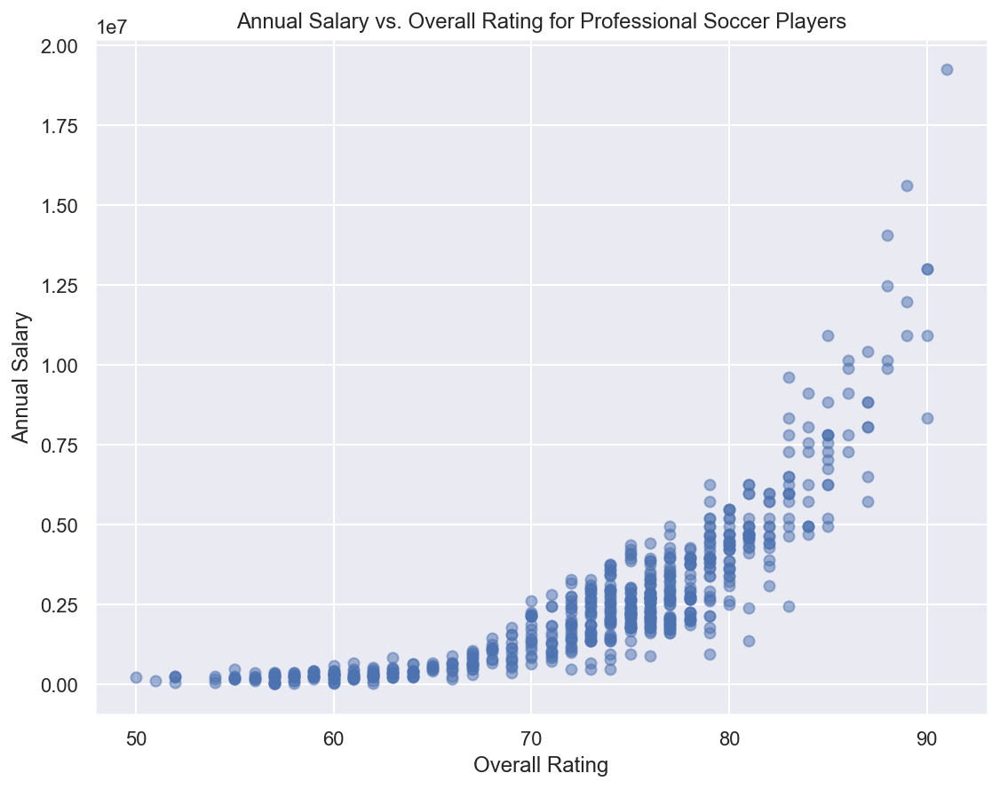

In [284]:
fig, ax = plt.subplots(figsize=(9, 7))

x = all_players[['overall_rating']]
y = all_players['wage']

ax.scatter(x, y, alpha=.5)
ax.set_xlabel('Overall Rating')
ax.set_ylabel('Annual Salary')
ax.set_title('Annual Salary vs. Overall Rating for Professional Soccer Players');

This feature clearly shows a non-linear relationship and will need adjusting in subsequent analyses

In [285]:
lr = LinearRegression()

lr.fit(x,y)

lr.score(x,y) #R2

0.6472163141084668

In [286]:
from sklearn.metrics import mean_squared_error, r2_score

In [287]:
preds = lr.predict(x)

np.sqrt(mean_squared_error(y, preds))

r2_score(y, preds)

0.6472163141084668

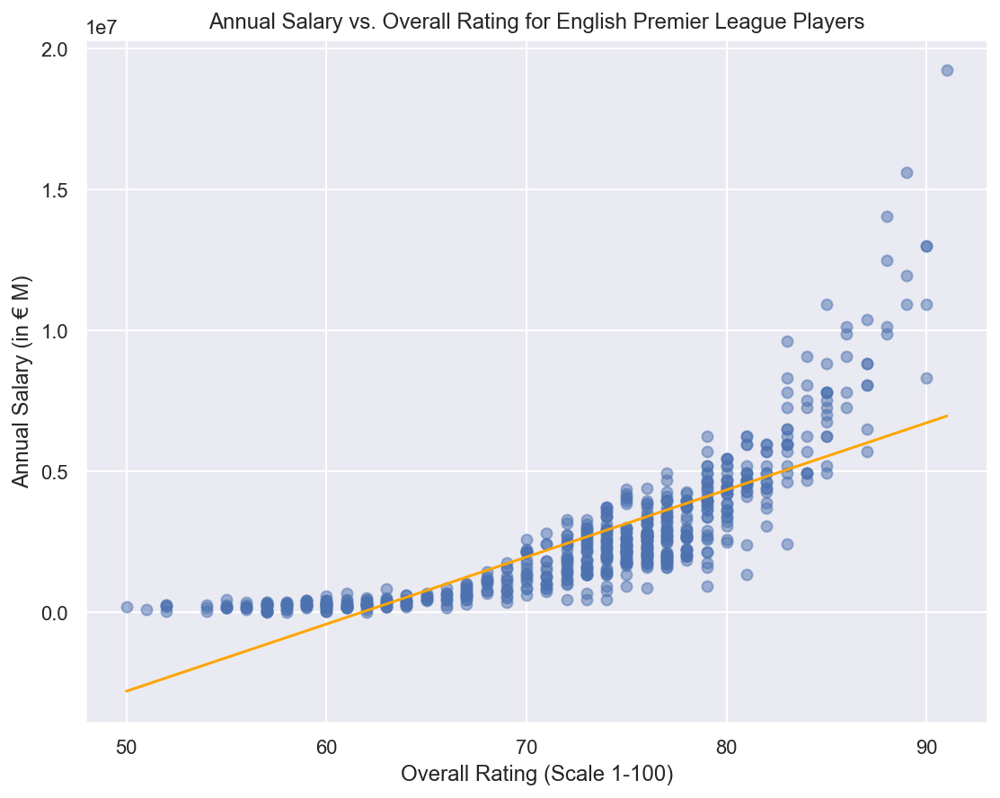

In [290]:
fig, ax = plt.subplots(figsize=(9, 7))

x = all_players[['overall_rating']]
y = all_players['wage']
ax.scatter(x, y, alpha=.5)

_x = np.linspace(x.min(), x.max())
_y = lr.predict(_x)

ax.set_xlabel('Overall Rating (Scale 1-100)')
ax.set_ylabel('Annual Salary (in € M)')
ax.set_title('Annual Salary vs. Overall Rating for English Premier League Players');


ax.plot(_x, _y, color='orange');

In [138]:
print(f'slope: {lr.coef_[0]:.2f}')
print(f'y-intercept: {lr.intercept_:.2f}')

slope: 238091.64
y-intercept: -14696667.86


In [139]:
#Create one hot encoding for position
all_players['position'].value_counts()

CB     126
CM      80
ST      77
GK      66
CDM     45
RB      45
LB      45
CAM     45
LM      31
RM      30
LW      18
RW      16
RWB     11
LWB     10
CF       4
Name: position, dtype: int64

In [140]:
cat_X = df.loc[:, ['position']]


cat_y = all_players['wage']

In [141]:
cat_X

,position
name,
Kevin De Bruyne,CM
Alisson Ramsés Becker,GK
Mohamed Salah Ghaly,RW
Sadio Mané,LW
Virgil van Dijk,CB
...,...
Lewis Brunt,CM
Callum Miles Rowe,LB
Kyron Gordon,CB


In [142]:
ohe = OneHotEncoder(drop='first', sparse=False)

ohe.fit(cat_X)

ohe_X = ohe.transform(cat_X)

columns = ohe.get_feature_names(['position'])

ohe_X_df = pd.DataFrame(ohe_X, columns=columns, index=cat_X.index)

ohe_X_df.head()

,position_CB,position_CDM,position_CF,position_CM,position_GK,position_LB,position_LM,position_LW,position_LWB,position_RB,position_RM,position_RW,position_RWB,position_ST
name,,,,,,,,,,,,,,
Kevin De Bruyne,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alisson Ramsés Becker,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Mohamed Salah Ghaly,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
Sadio Mané,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Virgil van Dijk,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [143]:
cat_lr = LinearRegression()

cat_lr.fit(ohe_X_df, cat_y)

cat_lr.score(ohe_X_df, cat_y)

0.03997607702145933

In [144]:
cat_lr.coef_

array([ -168442.85714286,   524911.11111111,  1513488.88888888,
         277026.38888889,  -352208.08080808,    31488.88888888,
        -215511.11111111,  1236155.55555555, -1076111.11111112,
        -152244.44444445,   348688.88888889,  2000988.88888888,
        -760329.2929293 ,   291488.88888888])

In [145]:
combined_df = pd.concat([ohe_X_df, all_players[['overall_rating']]], axis=1)
combined_df.head()

,position_CB,position_CDM,position_CF,position_CM,position_GK,position_LB,position_LM,position_LW,position_LWB,position_RB,position_RM,position_RW,position_RWB,position_ST,overall_rating
name,,,,,,,,,,,,,,,
Kevin De Bruyne,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91
Alisson Ramsés Becker,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,90
Mohamed Salah Ghaly,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,90
Sadio Mané,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,90
Virgil van Dijk,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,90


In [147]:
combined_lr = LinearRegression()

combined_lr.fit(combined_df, cat_y)

combined_lr.score(combined_df, cat_y)

0.6737011294670003

In [148]:
combined_lr.coef_, combined_lr.intercept_

(array([ -702145.24881338,  -704429.01329236,   297453.31128632,
         -118783.87843799, -1212649.40755014,  -479405.7082658 ,
         -539283.69519503,   153165.44596202, -1142633.84511563,
         -673782.67903986,  -635847.57437796,   246119.16584973,
        -1181720.57524154,  -151673.47000666,   239481.84241626]),
 -14296332.413714021)

In [ ]:
##########################################################################################
##########################################################################################

In [ ]:
#Regularization Code...re-review the current setup, and pair down to key attributes based on 
#domain knowledge

In [149]:
%pylab inline
#% config InlineBackend.figure_format = 'svg'

import pandas as pd
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import r2_score

Populating the interactive namespace from numpy and matplotlib


In [150]:
all_players.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 56 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   nationality              649 non-null    object 
 1   position                 649 non-null    object 
 2   age                      649 non-null    int64  
 3   height                   649 non-null    int64  
 4   weight                   649 non-null    int64  
 5   club                     649 non-null    object 
 6   overall_rating           649 non-null    int64  
 7   Volleys                  649 non-null    int64  
 8   Short Passing            649 non-null    int64  
 9   Heading Accuracy         649 non-null    int64  
 10  Finishing                649 non-null    int64  
 11  Crossing                 649 non-null    int64  
 12  Ball Control             649 non-null    int64  
 13  Long Passing             649 non-null    int64  
 14  FK Accura

In [153]:
smaller_df= all_players.loc[:,['age', 'overall_rating', 'Short Passing', 
                      'Reactions', 'Long Passing', 'Shot Power', 
                      'Ball Control', 'Volleys', 'position', 
                      'Stamina','wage']]

In [154]:
smaller_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             649 non-null    int64 
 1   overall_rating  649 non-null    int64 
 2   Short Passing   649 non-null    int64 
 3   Reactions       649 non-null    int64 
 4   Long Passing    649 non-null    int64 
 5   Shot Power      649 non-null    int64 
 6   Ball Control    649 non-null    int64 
 7   Volleys         649 non-null    int64 
 8   position        649 non-null    object
 9   Stamina         649 non-null    int64 
 10  wage            649 non-null    int64 
dtypes: int64(10), object(1)
memory usage: 80.8+ KB


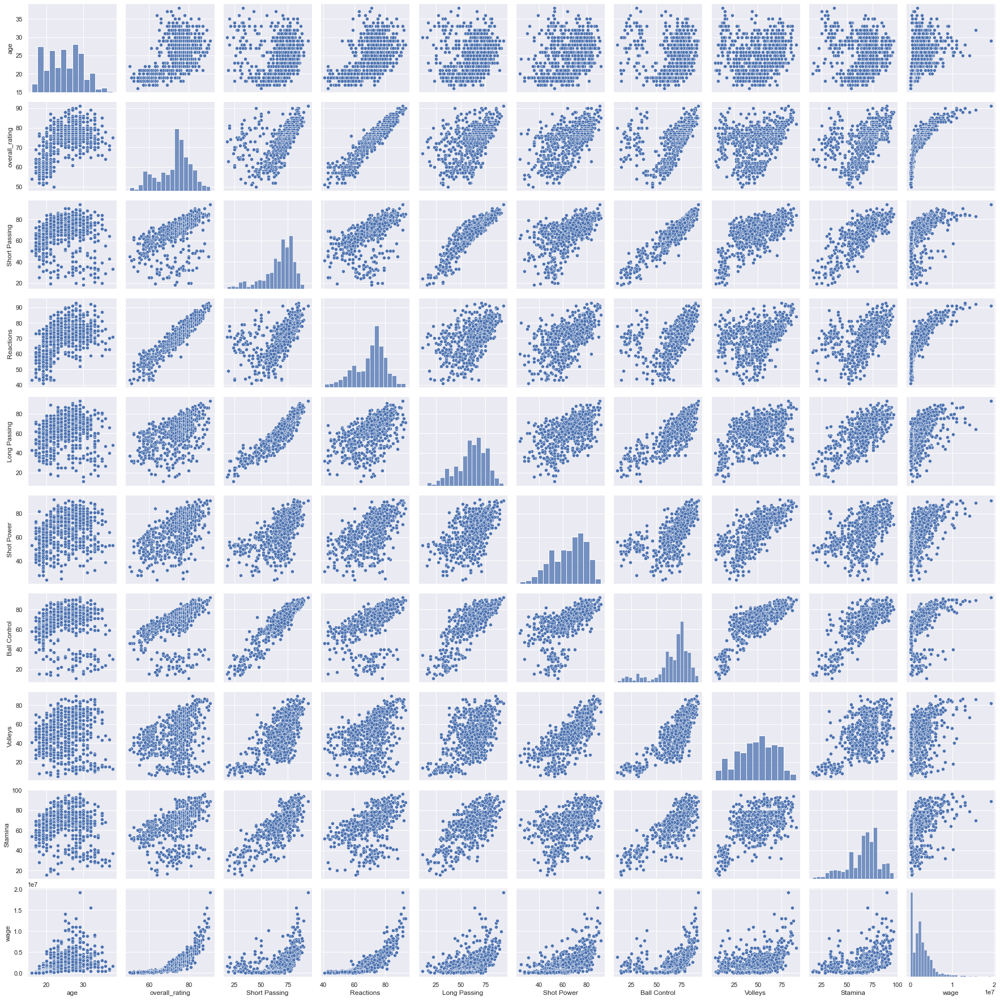

In [155]:
sns.pairplot(smaller_df)

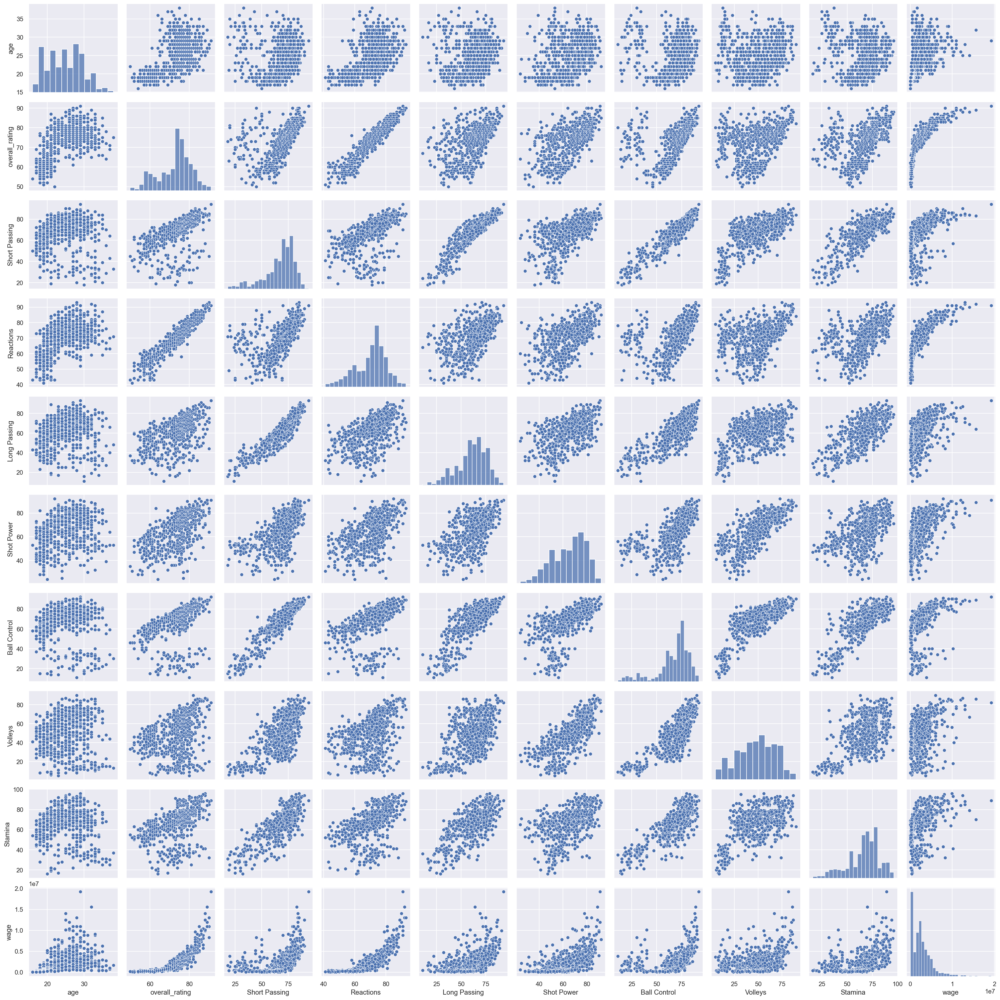

In [292]:
sns.pairplot(smaller_df);

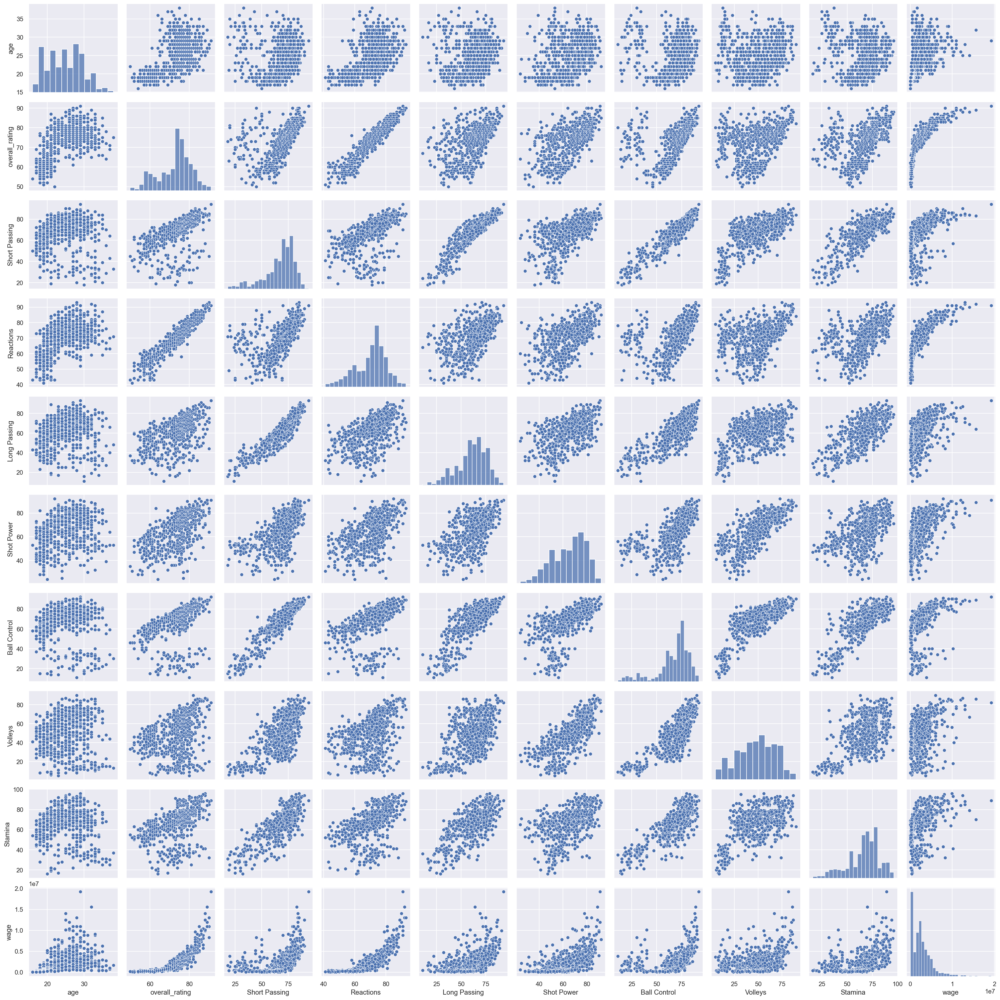

In [293]:
sns.pairplot(smaller_df)
ax.set_xlabel('X_axi',fontsize=8);
ax.set_ylabel('Y_axis',fontsize=8);

In [167]:
smaller_df['position'].value_counts()

In [172]:
defense = ['CB','RB','LB','LWB','RWB']
midfield = ['CM','CAM','CDM','LM','RM']
forward = ['RW','LW','CF','ST']
goalkeeper = ['GK']

In [178]:
def field_location(position):
    if position in defense:
        return 'Defense'
    elif position in midfield:
        return 'Midfield'
    elif position in forward:
        return 'Forward'
    else:
        return 'Goalkeeper'

In [179]:
smaller_df['field_position'] = smaller_df['position'].apply(field_position)

In [181]:
smaller_df['field_position'].value_counts()

Defense       237
Midfield      231
Forward       115
Goalkeeper     66
Name: field_position, dtype: int64

In [183]:
cat_X = smaller_df.loc[:, ['field_position']]

cat_y = smaller_df['wage']

In [184]:
ohe = OneHotEncoder(drop='first', sparse=False)

ohe.fit(cat_X)

ohe_X = ohe.transform(cat_X)

columns = ohe.get_feature_names(['position'])

ohe_X_df = pd.DataFrame(ohe_X, columns=columns, index=cat_X.index)

ohe_X_df.head()

,position_Forward,position_Goalkeeper,position_Midfield
name,,,
Kevin De Bruyne,0.0,0.0,1.0
Alisson Ramsés Becker,0.0,1.0,0.0
Mohamed Salah Ghaly,1.0,0.0,0.0
Sadio Mané,1.0,0.0,0.0
Virgil van Dijk,0.0,0.0,0.0


In [185]:
combined_df = pd.concat([ohe_X_df,smaller_df], axis=1)

combined_df.head()

,position_Forward,position_Goalkeeper,position_Midfield,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,position,Stamina,wage,field_position
name,,,,,,,,,,,,,,,
Kevin De Bruyne,0.0,0.0,1.0,29,91,94,91,93,91,92,82,CM,89,19240000,Midfield
Alisson Ramsés Becker,0.0,1.0,0.0,27,90,45,88,44,64,30,20,GK,32,8320000,Goalkeeper
Mohamed Salah Ghaly,1.0,0.0,0.0,28,90,84,92,75,80,89,79,RW,85,13000000,Forward
Sadio Mané,1.0,0.0,0.0,28,90,85,93,71,84,89,75,LW,88,13000000,Forward
Virgil van Dijk,0.0,0.0,0.0,28,90,79,89,86,81,77,45,CB,75,10920000,Defense


In [265]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   position_Forward     649 non-null    float64
 1   position_Goalkeeper  649 non-null    float64
 2   position_Midfield    649 non-null    float64
 3   age                  649 non-null    int64  
 4   overall_rating       649 non-null    int64  
 5   Short Passing        649 non-null    int64  
 6   Reactions            649 non-null    int64  
 7   Long Passing         649 non-null    int64  
 8   Shot Power           649 non-null    int64  
 9   Ball Control         649 non-null    int64  
 10  Volleys              649 non-null    int64  
 11  Stamina              649 non-null    int64  
 12  wage                 649 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 91.0+ KB


In [189]:
del combined_df['position']
combined_df.head()

,position_Forward,position_Goalkeeper,position_Midfield,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,wage
name,,,,,,,,,,,,,
Kevin De Bruyne,0.0,0.0,1.0,29,91,94,91,93,91,92,82,89,19240000
Alisson Ramsés Becker,0.0,1.0,0.0,27,90,45,88,44,64,30,20,32,8320000
Mohamed Salah Ghaly,1.0,0.0,0.0,28,90,84,92,75,80,89,79,85,13000000
Sadio Mané,1.0,0.0,0.0,28,90,85,93,71,84,89,75,88,13000000
Virgil van Dijk,0.0,0.0,0.0,28,90,79,89,86,81,77,45,75,10920000


In [191]:
#Separate our features from our target

X = combined_df.loc[:,['position_Forward','position_Goalkeeper','position_Midfield','age', 'overall_rating', 'Short Passing', 
                      'Reactions', 'Long Passing', 'Shot Power', 
                      'Ball Control', 'Volleys', 
                      'Stamina']]

y = combined_df['wage']

# create overall rating squared term (given non-linear distribution of rating to the target variable wage)
X['overall_rating_sqd'] = X['overall_rating'] ** 2 

In [192]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   position_Forward     649 non-null    float64
 1   position_Goalkeeper  649 non-null    float64
 2   position_Midfield    649 non-null    float64
 3   age                  649 non-null    int64  
 4   overall_rating       649 non-null    int64  
 5   Short Passing        649 non-null    int64  
 6   Reactions            649 non-null    int64  
 7   Long Passing         649 non-null    int64  
 8   Shot Power           649 non-null    int64  
 9   Ball Control         649 non-null    int64  
 10  Volleys              649 non-null    int64  
 11  Stamina              649 non-null    int64  
 12  overall_rating_sqd   649 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 91.0+ KB


In [193]:
#Split the data 60 - 20 - 20 train/val/test

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=.25, random_state=43)

In [194]:
X_train.columns

Index(['position_Forward', 'position_Goalkeeper', 'position_Midfield', 'age',
       'overall_rating', 'Short Passing', 'Reactions', 'Long Passing',
       'Shot Power', 'Ball Control', 'Volleys', 'Stamina',
       'overall_rating_sqd'],
      dtype='object')

In [195]:
X_train.shape

(389, 13)

In [196]:
X_val.shape

(130, 13)

In [197]:
X_test.shape

(130, 13)

In [198]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 389 entries, Ben White to Wesley Moraes Ferreira da Silva
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   position_Forward     389 non-null    float64
 1   position_Goalkeeper  389 non-null    float64
 2   position_Midfield    389 non-null    float64
 3   age                  389 non-null    int64  
 4   overall_rating       389 non-null    int64  
 5   Short Passing        389 non-null    int64  
 6   Reactions            389 non-null    int64  
 7   Long Passing         389 non-null    int64  
 8   Shot Power           389 non-null    int64  
 9   Ball Control         389 non-null    int64  
 10  Volleys              389 non-null    int64  
 11  Stamina              389 non-null    int64  
 12  overall_rating_sqd   389 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 42.5+ KB


In [206]:
X_train_cat_df = X_train[['position_Forward','position_Goalkeeper','position_Midfield']]

X_train_cat_df.head()

,position_Forward,position_Goalkeeper,position_Midfield
name,,,
Ben White,0.0,0.0,0.0
Joelinton Cassio Apolinário de Lira,1.0,0.0,0.0
Mace Lewin Goodridge,0.0,0.0,1.0
Fabio Carvalho,0.0,0.0,1.0
Yerry Fernando Mina González,0.0,0.0,0.0


In [207]:
X_test_cat_df = X_test[['position_Forward','position_Goalkeeper','position_Midfield']]

X_test_cat_df.head()

,position_Forward,position_Goalkeeper,position_Midfield
name,,,
Taylor Perry,0.0,0.0,1.0
Robert Snodgrass,0.0,0.0,1.0
Cole Palmer,0.0,0.0,1.0
Stefan Marius Johansen,0.0,0.0,1.0
Youri Tielemans,0.0,0.0,1.0


In [199]:
X_train_cont = X_train[['age', 'overall_rating', 'Short Passing',
                        'Reactions', 'Long Passing', 'Shot Power',
                        'Ball Control','Volleys','Stamina','overall_rating_sqd']]

X_train_cont.head()

,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,
Ben White,22,76,76,75,67,39,73,21,79,5776
Joelinton Cassio Apolinário de Lira,23,75,75,72,58,81,74,65,75,5625
Mace Lewin Goodridge,20,60,63,60,61,56,62,41,62,3600
Fabio Carvalho,17,58,63,47,54,46,60,47,44,3364
Yerry Fernando Mina González,25,79,76,74,69,68,61,41,67,6241


In [200]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

ss.fit(X_train_cont)
X_train_scaled = ss.transform(X_train_cont)

cont_columns = X_train_cont.columns
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=cont_columns, index=X_train_cont.index)

X_train_scaled_df.head()

,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,
Ben White,-0.644571,0.346054,0.646552,0.466246,0.404654,-1.898208,0.403841,-1.347706,0.841500,0.304213
Joelinton Cassio Apolinário de Lira,-0.430630,0.223230,0.575684,0.162614,-0.208103,1.158457,0.464495,0.879301,0.588334,0.174461
Mace Lewin Goodridge,-1.072451,-1.619127,-0.274725,-1.051916,-0.003851,-0.660986,-0.263354,-0.335430,-0.234455,-1.565589
Fabio Carvalho,-1.714272,-1.864774,-0.274725,-2.367657,-0.480439,-1.388764,-0.384662,-0.031747,-1.373701,-1.768380
Yerry Fernando Mina González,-0.002750,0.714525,0.646552,0.365035,0.540822,0.212346,-0.324008,-0.335430,0.082002,0.703780


In [202]:
X_test_cont = X_test[['age', 'overall_rating', 'Short Passing',
                        'Reactions', 'Long Passing', 'Shot Power',
                        'Ball Control','Volleys','Stamina','overall_rating_sqd']]

X_test_cont.head()

,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,
Taylor Perry,18,55,57,52,56,58,57,49,55,3025
Robert Snodgrass,32,77,76,75,74,81,81,65,74,5929
Cole Palmer,18,59,59,52,56,65,62,51,60,3481
Stefan Marius Johansen,29,72,74,73,73,72,74,64,78,5184
Youri Tielemans,23,82,86,79,84,87,85,78,82,6724


In [203]:
X_test_scaled = ss.transform(X_test_cont)

cont_columns = X_test_cont.columns
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=cont_columns, index=X_test_cont.index)

X_test_scaled_df.head()

,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,
Taylor Perry,-1.500332,-2.233246,-0.699930,-1.861603,-0.344271,-0.515431,-0.566625,0.069480,-0.677495,-2.059677
Robert Snodgrass,1.494832,0.468877,0.646552,0.466246,0.881242,1.158457,0.889074,0.879301,0.525042,0.435683
Cole Palmer,-1.500332,-1.741951,-0.558195,-1.861603,-0.344271,-0.005987,-0.263354,0.170708,-0.361038,-1.667844
Stefan Marius Johansen,0.853011,-0.145241,0.504817,0.263825,0.813158,0.503457,0.464495,0.828687,0.778208,-0.204483
Youri Tielemans,-0.430630,1.082996,1.355227,0.871089,1.562082,1.595123,1.131690,1.537280,1.031374,1.118814


In [208]:
X_train_combined = pd.concat([X_train_cat_df, X_train_scaled_df], axis='columns')

X_train_combined.head()

,position_Forward,position_Goalkeeper,position_Midfield,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,,,,
Ben White,0.0,0.0,0.0,-0.644571,0.346054,0.646552,0.466246,0.404654,-1.898208,0.403841,-1.347706,0.841500,0.304213
Joelinton Cassio Apolinário de Lira,1.0,0.0,0.0,-0.430630,0.223230,0.575684,0.162614,-0.208103,1.158457,0.464495,0.879301,0.588334,0.174461
Mace Lewin Goodridge,0.0,0.0,1.0,-1.072451,-1.619127,-0.274725,-1.051916,-0.003851,-0.660986,-0.263354,-0.335430,-0.234455,-1.565589
Fabio Carvalho,0.0,0.0,1.0,-1.714272,-1.864774,-0.274725,-2.367657,-0.480439,-1.388764,-0.384662,-0.031747,-1.373701,-1.768380
Yerry Fernando Mina González,0.0,0.0,0.0,-0.002750,0.714525,0.646552,0.365035,0.540822,0.212346,-0.324008,-0.335430,0.082002,0.703780


In [210]:
X_test_combined = pd.concat([X_test_cat_df, X_test_scaled_df], axis='columns')

X_test_combined.head()

,position_Forward,position_Goalkeeper,position_Midfield,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,,,,
Taylor Perry,0.0,0.0,1.0,-1.500332,-2.233246,-0.699930,-1.861603,-0.344271,-0.515431,-0.566625,0.069480,-0.677495,-2.059677
Robert Snodgrass,0.0,0.0,1.0,1.494832,0.468877,0.646552,0.466246,0.881242,1.158457,0.889074,0.879301,0.525042,0.435683
Cole Palmer,0.0,0.0,1.0,-1.500332,-1.741951,-0.558195,-1.861603,-0.344271,-0.005987,-0.263354,0.170708,-0.361038,-1.667844
Stefan Marius Johansen,0.0,0.0,1.0,0.853011,-0.145241,0.504817,0.263825,0.813158,0.503457,0.464495,0.828687,0.778208,-0.204483
Youri Tielemans,0.0,0.0,1.0,-0.430630,1.082996,1.355227,0.871089,1.562082,1.595123,1.131690,1.537280,1.031374,1.118814


In [211]:
lr = LinearRegression()

lr.fit(X_train_combined, y_train)

y_pred = lr.predict(X_test_combined)

y_pred

array([ 9.01410320e+05,  3.58109977e+06,  1.97261390e+05,  1.91304627e+06,
        5.63672049e+06,  9.34448338e+05,  3.81829941e+06,  4.02636836e+06,
        3.40500813e+06,  3.17694144e+06,  1.97021134e+05,  3.04650527e+06,
        2.78566492e+06,  4.74708365e+06,  1.30708900e+06,  2.53083481e+06,
        2.19609897e+06,  3.97348524e+05,  5.47034528e+06,  9.49437360e+06,
        2.65039344e+06,  5.98858696e+06,  2.07837761e+06,  6.35652759e+06,
       -4.69878685e+03,  2.10773977e+06,  3.40694456e+06,  2.19406800e+06,
        3.06942448e+05,  7.86139573e+06,  7.47003793e+05,  5.68520791e+06,
        3.92540804e+06,  5.99545315e+05,  1.06511340e+05,  2.68972187e+06,
        4.63865072e+06,  2.51861093e+06,  3.42682473e+06,  3.75888950e+06,
        3.79332322e+06,  2.46600923e+06, -7.21022247e+05,  4.31771970e+06,
        5.09442167e+05,  1.12025847e+07,  5.93886439e+05,  2.57954755e+06,
        2.26828673e+06,  6.66630437e+05,  1.67953140e+06,  5.23509087e+06,
        2.09147837e+05,  

In [212]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = np.sqrt(mean_squared_error(y_test, y_pred))

r2 = r2_score(y_test, y_pred)

print(f'RMSE: {rmse:.2f}\nr2: {r2:.2f}')

RMSE: 976238.53
r2: 0.85


In [213]:
score = lr.score(X_test_combined, y_test) 
score

0.8537175625214011

In [214]:
feature_names = X_test_combined.columns

coefficient_values = np.round(lr.coef_, 3)

feats_values = list(zip(feature_names, coefficient_values)) 

sorted(feats_values, key=lambda x: x[1])

[('overall_rating', -14639820.889),
 ('position_Midfield', -303696.159),
 ('Shot Power', -65550.972),
 ('Long Passing', 13506.62),
 ('Reactions', 41123.257),
 ('position_Forward', 51466.576),
 ('Stamina', 68793.583),
 ('Volleys', 219381.677),
 ('age', 243549.106),
 ('Ball Control', 252777.735),
 ('Short Passing', 254886.353),
 ('position_Goalkeeper', 847830.523),
 ('overall_rating_sqd', 16244028.641)]

In [215]:
lr.intercept_

2734062.080349645

In [ ]:
##########################################################################################
##########################################################################################

In [217]:
selected_columns = ['position_Forward','position_Goalkeeper','position_Midfield','age', 'overall_rating', 'Short Passing',
                        'Reactions', 'Long Passing', 'Shot Power',
                        'Ball Control','Volleys','Stamina','overall_rating_sqd']

In [218]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 389 entries, Ben White to Wesley Moraes Ferreira da Silva
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   position_Forward     389 non-null    float64
 1   position_Goalkeeper  389 non-null    float64
 2   position_Midfield    389 non-null    float64
 3   age                  389 non-null    int64  
 4   overall_rating       389 non-null    int64  
 5   Short Passing        389 non-null    int64  
 6   Reactions            389 non-null    int64  
 7   Long Passing         389 non-null    int64  
 8   Shot Power           389 non-null    int64  
 9   Ball Control         389 non-null    int64  
 10  Volleys              389 non-null    int64  
 11  Stamina              389 non-null    int64  
 12  overall_rating_sqd   389 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 42.5+ KB


In [254]:
lasso_model = Lasso(alpha = 1000000) # this is a VERY HIGH regularization strength!, wouldn't usually be used
lasso_model.fit(X_train.loc[:,selected_columns], y_train)

Lasso(alpha=1000000)

In [255]:
list(zip(selected_columns, lasso_model.coef_))

[('position_Forward', 0.0),
 ('position_Goalkeeper', -0.0),
 ('position_Midfield', -0.0),
 ('age', -0.0),
 ('overall_rating', -0.0),
 ('Short Passing', 0.0),
 ('Reactions', -0.0),
 ('Long Passing', 0.0),
 ('Shot Power', -0.0),
 ('Ball Control', 0.0),
 ('Volleys', 15924.20057579582),
 ('Stamina', 0.0),
 ('overall_rating_sqd', 1740.031988215088)]

In [256]:
lasso_model.score(X_test_scaled_df,y_test)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 13 is different from 10)

In [222]:
import statsmodels.api as sm
import statsmodels.formula.api as smf 

In [223]:
lr_model_ridge = Ridge(alpha = 1000000) # this is a VERY HIGH regularization strength!, wouldn't usually be used
lr_model_ridge.fit(X_train.loc[:,selected_columns], y_train)

Ridge(alpha=1000000)

In [224]:
list(zip(selected_columns, lr_model_ridge.coef_))

[('position_Forward', 23.5942289655895),
 ('position_Goalkeeper', -23.032091679154536),
 ('position_Midfield', 14.66215062705871),
 ('age', -108.34094601105002),
 ('overall_rating', -193.48447208429982),
 ('Short Passing', 710.2487845679125),
 ('Reactions', 24.004308671976602),
 ('Long Passing', 676.4119502165915),
 ('Shot Power', 446.92935110290796),
 ('Ball Control', 1054.6098146079657),
 ('Volleys', 2090.449591022846),
 ('Stamina', 742.5741758167003),
 ('overall_rating_sqd', 1784.5240459045629)]

In [225]:
test_set_pred = lasso_model.predict(X_test.loc[:,selected_columns])

In [261]:
X_test_scaled_df

,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,overall_rating_sqd
name,,,,,,,,,,
Taylor Perry,-1.500332,-2.233246,-0.699930,-1.861603,-0.344271,-0.515431,-0.566625,0.069480,-0.677495,-2.059677
Robert Snodgrass,1.494832,0.468877,0.646552,0.466246,0.881242,1.158457,0.889074,0.879301,0.525042,0.435683
Cole Palmer,-1.500332,-1.741951,-0.558195,-1.861603,-0.344271,-0.005987,-0.263354,0.170708,-0.361038,-1.667844
Stefan Marius Johansen,0.853011,-0.145241,0.504817,0.263825,0.813158,0.503457,0.464495,0.828687,0.778208,-0.204483
Youri Tielemans,-0.430630,1.082996,1.355227,0.871089,1.562082,1.595123,1.131690,1.537280,1.031374,1.118814
...,...,...,...,...,...,...,...,...,...,...
Andi Avdi Zeqiri,-0.858511,-0.882184,-0.558195,-0.849494,-1.569783,0.285124,0.100570,0.525004,0.145294,-0.915970
Percy Muzi Tau,0.211190,0.100406,0.433950,-0.141019,-0.344271,0.212346,0.828420,1.284211,0.145294,0.046428
Wesley Foderingham,0.853011,-0.268065,-2.613353,-0.141019,-1.842119,-1.024875,-2.325594,-1.752617,-2.006616,-0.327361


In [257]:
test_set_pred2 = lasso_model.predict(X_test_scaled_df.loc[:,selected_columns])

KeyError: "Passing list-likes to .loc or [] with any missing labels is no longer supported. The following labels were missing: Index(['position_Forward', 'position_Goalkeeper', 'position_Midfield'], dtype='object'). See https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike"

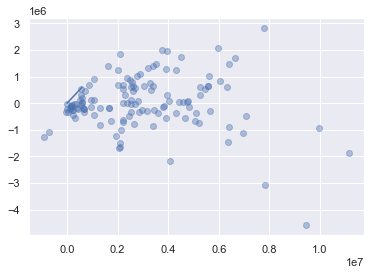

In [259]:
plt.scatter(test_set_pred, test_set_pred-y_test, alpha=.4)
plt.plot(np.linspace(0,600000,1000), np.linspace(0,600000,1000));

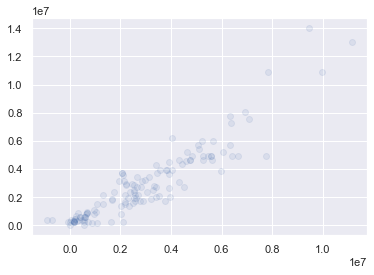

In [260]:
plt.scatter(test_set_pred, y_test, alpha=.1)
plt.plot(np.linspace(0,600,1000), np.linspace(0,600,1000));

In [228]:
#r-squared
r2_score(y_test, test_set_pred)

0.716027636877115

In [239]:
#Mean Absolute Error (MAE)
def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)) 

mae(y_test, test_set_pred)

978111.6308556112

In [229]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [230]:
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [231]:
X_tr = std.transform(X_train.values)

In [232]:
X_te = std.transform(X_test.values)

(array([31., 54., 42., 52., 58., 58., 43., 26., 17.,  8.]),
 array([-1.92821225, -1.4789377 , -1.02966314, -0.58038859, -0.13111403,
         0.31816052,  0.76743508,  1.21670963,  1.66598419,  2.11525874,
         2.5645333 ]),
 <BarContainer object of 10 artists>)

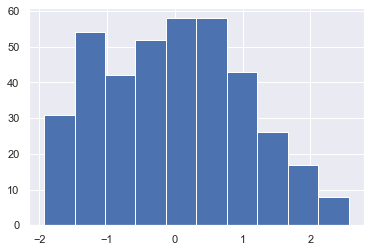

In [234]:
plt.hist(X_tr[:,3])

In [236]:
lasso_model = Lasso(alpha = 10000)
lasso_model.fit(X_tr,y_train)

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3362800577738.125, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=10000)

In [237]:
list(zip(X_train.columns, lasso_model.coef_))

[('position_Forward', 46829.884180842746),
 ('position_Goalkeeper', 0.0),
 ('position_Midfield', -59474.97830996183),
 ('age', 131580.2212150155),
 ('overall_rating', -9502697.795758825),
 ('Short Passing', 59116.46711731849),
 ('Reactions', 0.0),
 ('Long Passing', 90287.56370385422),
 ('Shot Power', -74385.57738300502),
 ('Ball Control', 0.0),
 ('Volleys', 293471.0067349247),
 ('Stamina', 22280.81488560425),
 ('overall_rating_sqd', 11386918.668487232)]

In [240]:
alphalist = 10**(np.linspace(-2,2,200))
err_vec_val = np.zeros(len(alphalist))
err_vec_train = np.zeros(len(alphalist))

for i,curr_alpha in enumerate(alphalist):

    # note the use of a new sklearn utility: Pipeline to pack
    # multiple modeling steps into one fitting process 
    steps = [('standardize', StandardScaler()), 
             ('lasso', Lasso(alpha = curr_alpha))]

    pipe = Pipeline(steps)
    pipe.fit(X_train.loc[:,selected_columns].values, y_train)
    
    val_set_pred = pipe.predict(X_val.loc[:,selected_columns].values)
    err_vec_val[i] = mae(y_val, val_set_pred)

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177479433159315.62, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177479269756585.84, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177479098613562.1, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/s

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177462859007191.62, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177461910553630.16, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177460917179131.47, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177366688199621.38, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177361186797726.7, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 177355425064144.34, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/s

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176744875136677.8, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176710029417230.7, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176673544082477.5, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/skl

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172860725941196.25, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172646270678344.25, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172422084675948.84, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149777952655338.5, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148630583895283.4, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147443007104935.66, tolerance: 250004334936.78152
  model = cd_fast.enet_coordinate_descent(


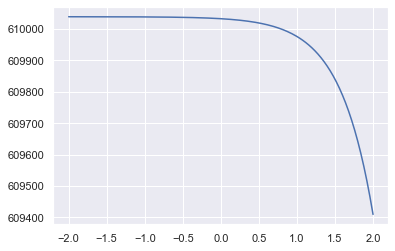

In [241]:
#plot the curve of validation error as alpha changes

plt.plot(np.log10(alphalist), err_vec_val)

In [242]:
## This is the minimum error achieved on the validation set 
## across the different alpha values we tried

np.min(err_vec_val)

609408.9375875627

In [243]:
## This is the value of alpha that gave us the lowest error
alphalist[np.argmin(err_vec_val)]

100.0

In [ ]:
##########################################################################################
##########################################################################################

In [ ]:
#Automated Regularization

In [244]:
## Scale the data as before
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [ ]:
## Scale the Predictors on both the train and test set
X_tr = std.transform(X_train.values)
X_te = std.transform(X_test.values)

In [245]:
# Run the cross validation, find the best alpha, refit the model on all the data with that alpha

alphavec = 10**np.linspace(-2,2,200)

lasso_model = LassoCV(alphas = alphavec, cv=5)
lasso_model.fit(X_tr, y_train)

/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117449546970198.28, tolerance: 214147900188.29584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1251056119689.5938, tolerance: 214147900188.29584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129503572809628.16, tolerance: 211615941927.4598
  model = cd_fast.enet_coordinate_descent_gram(
/Users/arcarter/opt/anaconda3/lib/python3.8/

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

In [246]:
# This is the best alpha value it found - not far from the value
# selected using simple validation
lasso_model.alpha_

91.15888299750827

In [247]:
# These are the (standardized) coefficients found
# when it refit using that best alpha
list(zip(X_train.columns, lasso_model.coef_))

[('position_Forward', 20332.732686192052),
 ('position_Goalkeeper', 257955.68100197),
 ('position_Midfield', -141418.54054277693),
 ('age', 237047.67252585557),
 ('overall_rating', -14352393.138684455),
 ('Short Passing', 246397.1438184099),
 ('Reactions', 44715.57573395396),
 ('Long Passing', 19716.261143221152),
 ('Shot Power', -68309.08696425236),
 ('Ball Control', 240833.64046523912),
 ('Volleys', 226222.41408521932),
 ('Stamina', 67613.51658304651),
 ('overall_rating_sqd', 15963730.34001351)]

In [248]:
# Make predictions on the test set using the new model
test_set_pred = lasso_model.predict(X_te)

In [249]:
# Find the MAE and R^2 on the test set using this model
mae(y_test, test_set_pred)

683058.3449202187

In [250]:
r2_score(y_test, test_set_pred)

0.8539136334195137

In [36]:
#Check country of origin for potential One-Hot-Encoder. Will instead consider assigning a "UK" vs "Non-Uk" designation. 
#Other attributes of the player pulled from their page have also already been brought in binary encoded.
all_players.nationality.value_counts()

England                  265
France                    35
Spain                     28
Brazil                    26
Republic of Ireland       25
Portugal                  24
Netherlands               23
Scotland                  21
Wales                     16
Belgium                   14
Germany                   12
Argentina                 11
Ivory Coast                9
Denmark                    8
Switzerland                8
Ghana                      8
Northern Ireland           7
United States              6
Poland                     6
Nigeria                    6
Colombia                   5
Italy                      5
Sweden                     5
Serbia                     4
Egypt                      4
DR Congo                   4
Senegal                    4
Algeria                    4
Turkey                     3
Romania                    3
Jamaica                    3
Czech Republic             3
Croatia                    3
Morocco                    3
Iceland       

In [ ]:
##########################################################################################
##########################################################################################

In [264]:
%pylab inline
%config InlineBackend.figure_formats = ['retina']

import pandas as pd
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

Populating the interactive namespace from numpy and matplotlib


/Users/arcarter/opt/anaconda3/lib/python3.8/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['std']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [266]:
combined_df.head()

,position_Forward,position_Goalkeeper,position_Midfield,age,overall_rating,Short Passing,Reactions,Long Passing,Shot Power,Ball Control,Volleys,Stamina,wage
name,,,,,,,,,,,,,
Kevin De Bruyne,0.0,0.0,1.0,29,91,94,91,93,91,92,82,89,19240000
Alisson Ramsés Becker,0.0,1.0,0.0,27,90,45,88,44,64,30,20,32,8320000
Mohamed Salah Ghaly,1.0,0.0,0.0,28,90,84,92,75,80,89,79,85,13000000
Sadio Mané,1.0,0.0,0.0,28,90,85,93,71,84,89,75,88,13000000
Virgil van Dijk,0.0,0.0,0.0,28,90,79,89,86,81,77,45,75,10920000


In [269]:
X = combined_df.loc[:,['position_Forward','position_Goalkeeper','position_Midfield','age', 'overall_rating', 'Short Passing',
                        'Reactions', 'Long Passing', 'Shot Power',
                        'Ball Control','Volleys','Stamina']]

y = combined_df['wage']

In [270]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 649 entries, Kevin De Bruyne to Harry Boyes
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   position_Forward     649 non-null    float64
 1   position_Goalkeeper  649 non-null    float64
 2   position_Midfield    649 non-null    float64
 3   age                  649 non-null    int64  
 4   overall_rating       649 non-null    int64  
 5   Short Passing        649 non-null    int64  
 6   Reactions            649 non-null    int64  
 7   Long Passing         649 non-null    int64  
 8   Shot Power           649 non-null    int64  
 9   Ball Control         649 non-null    int64  
 10  Volleys              649 non-null    int64  
 11  Stamina              649 non-null    int64  
dtypes: float64(3), int64(9)
memory usage: 85.9+ KB


In [271]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    
    # report results
    print('\nValidation R^2 score was:', val_score)
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}') 

In [272]:
split_and_validate(X, y)


Validation R^2 score was: 0.6842059473965203
Feature coefficient results: 

position_Forward : 134825.09
position_Goalkeeper : 75064.06
position_Midfield : -24082.65
age : -24292.05
overall_rating : 216890.43
Short Passing : -6631.35
Reactions : 19514.21
Long Passing : 20417.61
Shot Power : -13063.97
Ball Control : -21765.56
Volleys : 30712.43
Stamina : 2736.89


In [273]:
X2 = X.copy()

X2['Overall_Rating_Sqd'] = X2['overall_rating'] ** 2
X2['Reactions_Sqd'] = X2['Reactions'] ** 2

split_and_validate(X2, y)


Validation R^2 score was: 0.8606611004124574
Feature coefficient results: 

position_Forward : 71340.18
position_Goalkeeper : 948915.77
position_Midfield : -168313.99
age : 37785.98
overall_rating : -1469906.36
Short Passing : 19570.72
Reactions : -170717.64
Long Passing : -736.39
Shot Power : -1504.57
Ball Control : 13720.49
Volleys : 8430.37
Stamina : 466.62
Overall_Rating_Sqd : 11604.60
Reactions_Sqd : 1372.85


In [279]:
X3 = X.copy()

X3['Overall_Rating_Inv'] = 20000000/(1-X3['overall_rating'])
X3['Overall_Rating_Sqd'] = X3['overall_rating'] ** 2
X3['Reactions_Sqd'] = X3['Reactions'] ** 2

split_and_validate(X3, y)


Validation R^2 score was: 0.8807344070589351
Feature coefficient results: 

position_Forward : 16776.45
position_Goalkeeper : 512808.86
position_Midfield : -147074.70
age : 54329.46
overall_rating : -7572622.44
Short Passing : 17805.30
Reactions : -113046.47
Long Passing : -5064.52
Shot Power : -1649.63
Ball Control : 11202.70
Volleys : 8692.61
Stamina : 2496.31
Overall_Rating_Inv : 468.91
Overall_Rating_Sqd : 40692.04
Reactions_Sqd : 891.03


In [ ]:
##########################################################################################
##########################################################################################

In [282]:
#Adding in interaction terms
X4 = X3.copy()

# multiplicative interaction
X4['Forward_Shot'] = X4['position_Forward'] * X4['Shot Power']

# division interaction
#X4['Midf_Control'] = X4['position_Midfield'] * X4['Ball Control']

split_and_validate(X4, y)


Validation R^2 score was: 0.8813059425055979
Feature coefficient results: 

position_Forward : -187848.98
position_Goalkeeper : 513668.04
position_Midfield : -144766.79
age : 54197.54
overall_rating : -7565707.72
Short Passing : 17504.56
Reactions : -110950.76
Long Passing : -4916.68
Shot Power : -1722.64
Ball Control : 11431.36
Volleys : 8568.43
Stamina : 2508.20
Overall_Rating_Inv : 468.16
Overall_Rating_Sqd : 40665.45
Reactions_Sqd : 873.73
Forward_Shot : 2805.31


In [ ]:
##########################################################################################
##########################################################################################

In [38]:
#Add in championship, create list of pages
base_url_championship='https://sofifa.com/players?type=all&lg%5B%5D=14'
offset=60
print(base_url_championship)
url_list_championship = [base_url_championship]
for i in range(11):
    
    new_link = 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset={}'.format(offset)
    url_list_championship.append(new_link)
    #print(new_link)
    offset+=60

url_list_championship


https://sofifa.com/players?type=all&lg%5B%5D=14


['https://sofifa.com/players?type=all&lg%5B%5D=14',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=60',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=120',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=180',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=240',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=300',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=360',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=420',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=480',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=540',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=600',
 'https://sofifa.com/players?type=all&lg%5B0%5D=14&offset=660']

In [39]:
#Create list of players in Championship
players_champ={}
for i in url_list_championship:
    url=i 
    response_search_page = requests.get(url)
    page_response_search_page = response_search_page.text
    soup = BeautifulSoup(page_response_search_page,'lxml')
    page_table = soup.find_all('a',class_="tooltip")
    page_table=page_table[:-4]
    page_table
    for element in page_table:
        name=element['data-tooltip']
        url='https://sofifa.com/'+element['href']+'?attr=classic'
        players_champ[name]=[name] + [url]
        
players_champ

{'Emiliano Buendía': ['Emiliano Buendía',
  'https://sofifa.com//player/226162/emiliano-buendia/210022/?attr=classic'],
 'Ben Foster': ['Ben Foster',
  'https://sofifa.com//player/163155/ben-foster/210022/?attr=classic'],
 'Ismaïla Sarr': ['Ismaïla Sarr',
  'https://sofifa.com//player/235353/ismaila-sarr/210022/?attr=classic'],
 'Joshua King': ['Joshua King',
  'https://sofifa.com//player/185422/joshua-king/210022/?attr=classic'],
 'Harry Wilson': ['Harry Wilson',
  'https://sofifa.com//player/220710/harry-wilson/210022/?attr=classic'],
 'Wayne Rooney': ['Wayne Rooney',
  'https://sofifa.com//player/54050/wayne-rooney/210022/?attr=classic'],
 'Tim Krul': ['Tim Krul',
  'https://sofifa.com//player/170597/tim-krul/210022/?attr=classic'],
 'Teemu Pukki': ['Teemu Pukki',
  'https://sofifa.com//player/190362/teemu-pukki/210022/?attr=classic'],
 'Christian Kabasele': ['Christian Kabasele',
  'https://sofifa.com//player/190324/christian-kabasele/210022/?attr=classic'],
 'Troy Deeney': ['Troy 

In [40]:
#Create data frame of players in the Championship
df_player_list_champ = pd.DataFrame(players_champ).T
df_player_list_champ.columns = ['name','link']

In [41]:
#Collect data from all Championship players' pages
full_player_list_champ=[]
for i in df_player_list_champ.link:
    full_player_list_champ.append(get_player_dict_combo(i))

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€11M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€19K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

[<div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€16.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€66K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.7M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€10K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€7.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€14K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ Medium

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-83">83</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€15M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€13K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-

[<div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-78">78</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€8.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€13K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€8.5M<div class="sub">Value</div></div></div>, <div class="c

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€15K<div class="sub">Wage</div></div>
</div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€35K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.8M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€20K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-e

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.6M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€31K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</sp

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.6M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€31K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <lab

[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€6.5M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€10K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>High/ High</

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.8M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€18K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">4 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-e

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-77">77</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€3.1M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€12K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€250K<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€10K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</sp

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.3M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€10K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-el

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-72">72</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.1M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€12K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-82">82</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€4.2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€16K<div class="sub">Wage</div></div>
</div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-76">76</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€10K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.6M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€18K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <l

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.7M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€14K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-e

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€24K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-over

[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-75">75</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.4M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€23K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">5 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-overflow-ellipsis"><label>Work Rate</label><span>Medium/ High

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€11K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflo

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.1M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€17K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile<

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-71">71</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€20K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">2 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-ov

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-70">70</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-73">73</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.1M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€22K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</spa

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="su

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-80">80</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€16K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflo

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-69">69</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-79">79</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2.9M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€9K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</spa

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€130K<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€2K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Right</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label>International Reputation</label></li>
<li class="bp3-text-o

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="su

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-68">68</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€1.3M<div class="sub">Value</div></div></div>, <div class="c

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-81">81</span> <div class="sub

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€925K<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€5K<div class="sub">Wage</div></div>
</div>, <div class="column col-3">
<div class="card">
<h5>Profile</h5>
<ul class="pl">
<li class="bp3-text-overflow-ellipsis"><label>Preferred Foot</label>Left</li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Weak Foot</label></li>
<li class="bp3-text-overflow-ellipsis">3 <span class="bp3-icon bp3-icon-star">★</span> <label>Skill Moves</label></li>
<li class="bp3-text-overflow-ellipsis">1 <span class="bp3-icon bp3-icon-star">★</span> <label

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
[<div class="column col-3"><div><span class="bp3-tag p p-67">67</span> <div class="sub">Overall Rating</div></div></div>, <div class="column col-3"><div><span class="bp3-tag p p-74">74</span> <div class="sub">Potential</div></div></div>, <div class="column col-3"><div>€2M<div class="sub">Value</div></div></div>, <div class="column col-3"><div>€5K<div class="sub">Wage</div></div>
</div>, 

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Standing Tackle', 'Defensive Awareness']
['Sliding Tackle', 'Stan

In [ ]:
##########################################################################################
##########################################################################################

In [ ]:
#Add in league One



In [ ]:
##########################################################################################
##########################################################################################